# <center><font color='red'>3 - CYTOSKELETON PREPROCESSING</font></center>

### <center><font color='orange'>AUTHOR: Diogo Vieira</font></center>

-------------------------------------------

### <center><font color='grey'>Imports</font></center>

In [1]:
# Math, image processing and other useful libraries
from __future__ import print_function, unicode_literals, absolute_import, division
import os

import pandas as pd
import numpy as np
import cv2
from collections import OrderedDict
import copy
import math
import pickle
from matplotlib.ticker import MaxNLocator
from itertools import combinations

# Image processing
from skimage.measure import regionprops
from skimage.filters import meijering, sato, frangi, hessian, threshold_otsu
from skimage.morphology import extrema, skeletonize
from skimage.transform import probabilistic_hough_line
from skimage.draw import disk, circle_perimeter
from scipy.ndimage import gaussian_filter, grey_closing
from scipy.spatial import distance_matrix
from skimage import data, restoration, util
from roipoly import RoiPoly
from matplotlib_scalebar.scalebar import ScaleBar
from biosppy.signals import tools
from biosppy.stats import pearson_correlation
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Plotting
import matplotlib.pyplot as plt
import matplotlib.cm as pltc
import matplotlib.colors as colors
import seaborn as sns

# Widgets
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display

# Feature Extraction (.py files by Teresa Parreira)
# from CytoSkeletonPropsMorph import CytoSkeletonPropsMorph
# from CytoSkeletonRegionPropsInt import RegionPropsInt
# from FreqAnalysis import FreqAnalysis
# from GLCM import GLCM

# Graph
import sknw
import networkx as nx
from scipy.signal import argrelextrema

# 
from skan import Skeleton, summarize,draw
from skan.csr import skeleton_to_csgraph, sholl_analysis,make_degree_image
import scipy as sp
import scipy.sparse
from matplotlib.patches import Circle
from framework.ImageFeatures import ImageFeatures,getvoxelsize
from framework.Functions import cv2toski,pylsdtoski,polar_to_cartesian, remove_not1D, quantitative_analysis,hist_bin,hist_lim,create_separate_DFs,branch,graphAnalysis
from framework.Importing import label_image,label_image_soraia,init_import
from framework.PreProcessingCYTO import cytoskeleton_preprocessing, df_cytoskeleton_preprocessing
from framework.PreProcessingNUCL import excludeborder, nuclei_preprocessing, df_nuclei_preprocessing, nuclei_segmentation
from framework.Processing import process3Dnuclei,analyze_cell,df_analyze_cell
from framework.visualization import truncate_colormap, plot_hist, plot_pie
#from fractal_dimension import fractal_dimension
#from fractal_analysis_fxns import boxcount,boxcount_grayscale,fractal_dimension,fractal_dimension_grayscale,fractal_dimension_grayscale_DBC

print('📚 All libraries successfully imported 📚')

📚 All libraries successfully imported 📚


#### <center><font color='grey'>Directories</font></center>

In [2]:
### DATASET #1 (2D)
folder    = os.path.dirname(os.getcwd()) + "\\Datasets\\Set 1-a-tubulin_Sofia"
options   = ["RGB","CYTO_DECONV","NUCL_DECONV"]

### DATASET #2 (3D)
#folder    = os.path.dirname(os.getcwd()) + "\\Datasets\\Set 3D"
#options   = ["3D"]

### DATASET #3 (Soraia)
# folder    = os.path.dirname(os.getcwd()) + "\\Datasets\\Soraia"
# options   = ["3D"]

### DATASET #4 (Inês)
# folder    = os.path.dirname(os.getcwd()) + "\\Datasets\\Ines"
#options     = []


data = init_import(folder,options,label_image)
#data['NUCL_PRE'] = pd.read_pickle(folder + "\\NUCL_PRE\\NUCL_PRE.pkl") # pd.read_pickle(os.getcwd() + "\\NUCL_PRE_2D_StarDist.pkl") #
#data['CYTO_PRE'] = pd.read_pickle(folder + "\\CYTO_PRE\\CYTO_PRE.pkl") 
TextureDF = pd.read_pickle(folder + "\\TextureDF_sub.pkl") 

>>> [RGB] added.
>>> [CYTO_DECONV] added.
>>> [NUCL_DECONV] added.


In [3]:
image_id = 9

---

In [6]:
def cytoskeleton_preprocessing(image, algorithm, parameters,plot):
    """
    Preprocessing of a cytoskeleton image
        - image      = [image, image index]
        - algorithm  = string with any algorithm
        - parameters = [sigmas, gamma]
        - plot       = bool
    """

    # Imports
    from skimage.filters import meijering, sato, frangi, hessian, threshold_otsu, laplace, threshold_yen, rank
    from skimage.util import img_as_ubyte
    from skimage.morphology import extrema, skeletonize, disk
    from skimage import filters
    
    global texture,skeleton,e,s
    
    if algorithm == 1:
        # Hessian detection
        hessian_img = hessian(image[0],black_ridges=False,sigmas=parameters[0],mode='reflect',gamma=parameters[1])
        
        # Repair image to apply to cv2 algorithm
        hessian_img = hessian_img.astype(np.uint8)  # hessian_img *= 1 # or 255
        hessian_img = 1 - hessian_img
        
        # Get texture
        texture = hessian_img
        
        # Connect
        binary_adaptive = threshold_local(texture, 3,'median')
        #o = grey_closing(TextureDF['Image'][11], size=(5,5))
        otsu = threshold_otsu(binary_adaptive)
        texture = binary_adaptive > otsu
        
        # Skeleton
        skeleton = skeletonize(texture)
        
    if algorithm == 'contour':
        
        # Contour Detection
        contours, hierarchy = cv2.findContours(image[0], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  

        # Filter contours with area above certain threshold
        filt_contours = []
        remo_contours = []
        for contour in contours:
            if cv2.contourArea(contour) > 10:
                filt_contours.append(contour)
            else:
                remo_contours.append(contour)

        # Draw contours
        contour_out = np.zeros_like(image[0])
        removed_out = np.zeros_like(contour_out)
        cv2.drawContours(contour_out, filt_contours, -1, 255, 3)
        cv2.drawContours(removed_out, remo_contours, -1, 255, 3)

        # Draw inside contour lines
        contour_int = np.zeros_like(image[0]) 
        cv2.fillPoly(contour_int, pts = filt_contours, color=(255,255,255))

        # Hessian detection
        hessian_img = hessian(image[0],black_ridges=False,sigmas=parameters[0],mode='reflect',gamma=parameters[1])
        
        # Repair image to apply to cv2 algorithm
        hessian_img = hessian_img.astype(np.uint8)  # hessian_img *= 1 # or 255
        hessian_img = 1 - hessian_img
        
        
        # Get texture image
        texture = contour_int * hessian_img
        
        # Skeleton
        #skeleton = skeletonize(texture)
        
        return texture, contour_out, contour_int
        

        #
        #thr = threshold_otsu(skeleton)
        #a = cv2.Canny((skeleton * 255).astype(np.uint8), 1*thr, 0.75*thr)
    
    if algorithm == 'sato':
        # METHOD 2
        texture = sato(image[0], sigmas=parameters[0], black_ridges = False, mode = 'reflect')
        thr = threshold_otsu(texture)
        texture[texture > 0.3*thr] = 1
        skeleton = skeletonize(texture)
        
    if algorithm == 'meijing':
        texture = meijering(image[0], sigmas = parameters[0], black_ridges = False, mode = 'reflect')

        thr = threshold_otsu(texture)
        #cont = cv2.Canny((meij * 255).astype(np.uint8), 1*thr, 0.75*thr)

        texture[texture > 0.2*thr] = 1
        
        # Skeleton
        skeleton = skeletonize(texture)
        
    if algorithm == 'synthetic':
        # image = [image, image index, image name, image label]
        skeleton = image[0]
        #skeleton = skeletonize(image[0]/255)
        texture = skeleton
        
    if algorithm == 'new':
        ini = image[0] / np.max(image[0])
        gau = gaussian_filter(ini, sigma=1)
        s = sato(gau,black_ridges=False,sigmas=[1],mode='reflect') 
        h = hessian(s,black_ridges=False,sigmas=[0.006],mode='reflect') 
        texture = ((1 - h)!=0)*1
        skeleton = skeletonize(texture)
        
    if algorithm == 'soraia':
        ini = image[0] / np.max(image[0])
        gau = gaussian_filter(ini, sigma=1)
        s = sato(gau,black_ridges=False,sigmas=[1],mode='reflect') 
        h = hessian(s,black_ridges=False,sigmas=[0.9],mode='reflect') 
        texture = ((1 - h)!=0)*1
        skeleton = skeletonize(texture)
        
    if algorithm == 'original':
        global f
        
        # Remove blue channel and convert to grayscale
        tmp        = copy.deepcopy(image[0])
        tmp[:,:,0] = 0
        grey       = cv2.cvtColor(tmp,cv2.COLOR_RGB2GRAY)

        # Median filter for noise removal
        grey_       = rank.median(img_as_ubyte(grey), disk(2))

        # CLAHE for color adjustment
        clahe      = cv2.createCLAHE(clipLimit = 2, tileGridSize = (8,8))
        gra        = clahe.apply(grey_)

        # Gaussian filter and Otsu thresholding
        thresh_ori = threshold_otsu(gra)
        binary_ori = gra > thresh_ori*0.8
        temp       = binary_ori * gra
        gau = gaussian_filter(temp, sigma=0.1)

        # Sato filter
        s = sato(gau,black_ridges=False,sigmas=[3],mode='reflect') 

        # LAPLACIAN OPERATOR
        d = laplace(s)

        # CLAHE
        clahe  = cv2.createCLAHE(clipLimit =2, tileGridSize=(8,8))
        e = clahe.apply(((d - d.min()) * (1/(d.max() - d.min()) * 255)).astype('uint8'))

        # OTSU
        thresh_ori = threshold_otsu(e)
        binary_ori = e > thresh_ori
        f = binary_ori * e

        # HYSTERESIS THRESHOLDING
        low = 0#int(np.max(f)*0.2)
        high = 1#int(np.max(f)*0.4)
        minima = filters.apply_hysteresis_threshold(f, low, high)

        # Yen thresholding
        # PROBLEMA: BACKGROUND COLOR NOS ~150 EM VEZ DE 0. COMO CORRIGIR? YEN NÃO FUNCIONA BEM PARA FIBRAS MENOS INTENSAS
        thresh_yen = threshold_yen(minima)
        binary_yen = minima > thresh_yen
        texture_pre = binary_yen * minima
        texture = texture_pre * temp

        # Skeletonization
        if len(np.where(minima*1 == 1)[0]) > len(np.where(minima*1 == 0)[0]):
            skeleton_pre = skeletonize(1-texture_pre*1)
        else:
            skeleton_pre = skeletonize(texture_pre*1)

        # Contour Detection
        contours, hierarchy = cv2.findContours((skeleton_pre*1).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  

        # Filter contours with area above certain threshold
        remo_contours = []
        for contour in contours:
            if len(contour) <= 3:
                remo_contours.append(contour)

        removed_out = np.zeros_like(texture)
        cv2.fillPoly(removed_out, pts = remo_contours, color=(255,255,255))

        # Get final skeleton
        skeleton = skeleton_pre*1 - removed_out/255
 

    if plot:
        #plt.close('all')
        %matplotlib inline
        plt.figure(figsize=(15,15)); plt.title('original');              plt.imshow(np.max(ini)-ini,cmap='gray'); plt.axis('off')
        plt.savefig(".//cellX_1original.png",format='png',transparent=True,bbox_inches='tight',dpi=500)
        plt.show()
        plt.figure(figsize=(15,15)); plt.title('gaussian');              plt.imshow(np.max(gau)-gau,cmap='gray'); plt.axis('off')
        plt.savefig(".//cellX_2gaussian.png",format='png',transparent=True,bbox_inches='tight',dpi=500)
        plt.show()
        plt.figure(figsize=(15,15)); plt.title('sato');                  plt.imshow(np.max(s) -s,cmap='gray'); plt.axis('off')
        plt.savefig(".//cellX_3sato.png",format='png',transparent=True,bbox_inches='tight',dpi=500)
        plt.show()
        plt.figure(figsize=(15,15)); plt.title('hessian');               plt.imshow(h,cmap='gray'); plt.axis('off')
        plt.savefig(".//cellX_4hess.png",format='png',transparent=True,bbox_inches='tight',dpi=500)
        plt.show()
        plt.figure(figsize=(15,15)); plt.title('texture');               plt.imshow(texture,cmap='gray'); plt.axis('off')
        plt.show()
        plt.figure(figsize=(15,15)); plt.title('skeleton');              plt.imshow(1-skeleton,cmap='gray'); plt.axis('off')
        plt.savefig(".//cellX_5skeleton.png",format='png',transparent=True,bbox_inches='tight',dpi=500)
        plt.show()

        INDEX = image[1]
        grey = data['RGB']['Image'][INDEX][:,:,2]
        mult = np.stack([1*(grey / np.max(grey)),skeleton*(grey / np.max(grey)), 0.6 * (data['RGB']['Image'][INDEX][:,:,0] / np.max(data['RGB']['Image'][INDEX][:,:,0]))],axis=2)
        plt.figure(figsize=(15,15)); plt.title('overlay');               plt.imshow(mult); plt.axis('off');
        plt.savefig(".//cellX_overlay.png",format='png',transparent=True,bbox_inches='tight',dpi=500)
        plt.show()
        # ORIGINAL
#         plt.figure(figsize=(15,15)); plt.title('Original');                      plt.imshow(grey,cmap='gray'); 
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('Original -> Median Filter');     plt.imshow(grey_,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('Median Filter -> CLAHE');        plt.imshow(gra,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('CLAHE -> Otsu');                 plt.imshow(temp,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('Otsu -> Gaussian filter');       plt.imshow(gau,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('Gaussian filter -> Sato');       plt.imshow(s,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('Sato -> Laplace');               plt.imshow(d,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('Laplace -> CLAHE');              plt.imshow(e,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('CLAHE -> Otsu and Hyst. Thr.');  plt.imshow(minima,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('Otsu and Hyst. Thr. -> Yen Thr -> * by temp -> TEXTURE'); plt.imshow(texture,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('TEXTURE -> SKELETON');           plt.imshow(skeleton_pre,cmap='gray');
#         plt.show()
#         plt.figure(figsize=(15,15)); plt.title('SKELETON -> SKELETON FILT.');    plt.imshow(skeleton,cmap='gray');
#         plt.show()

    return texture,skeleton

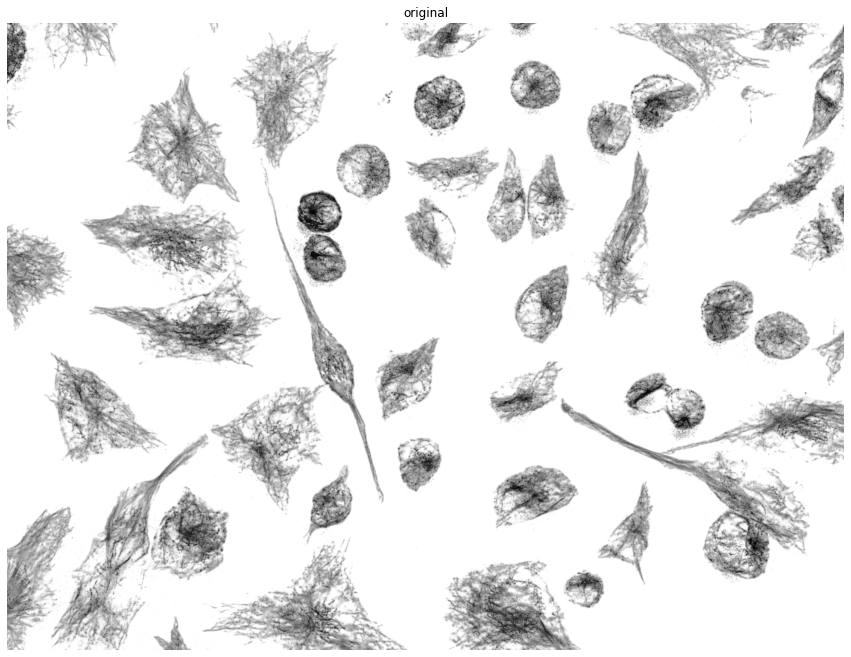

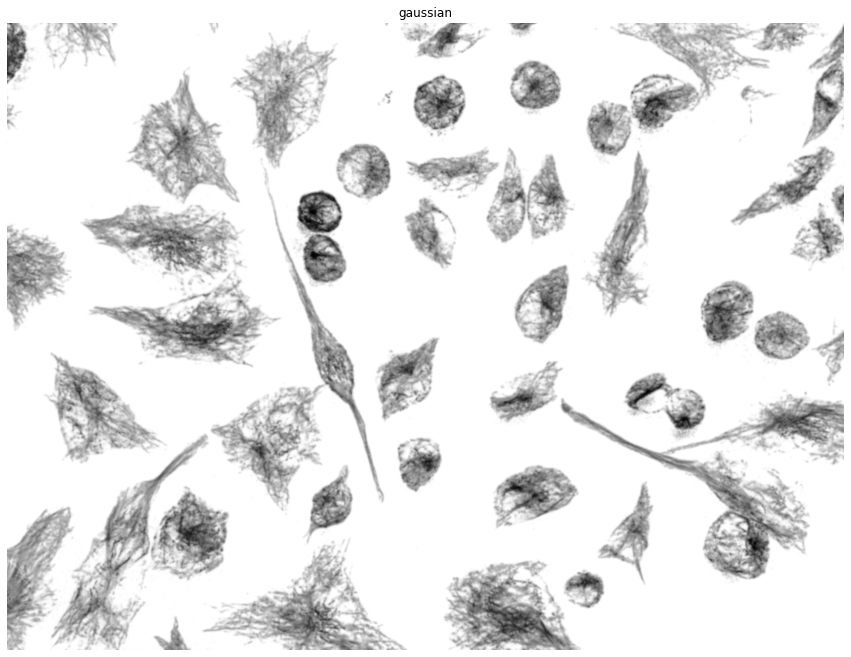

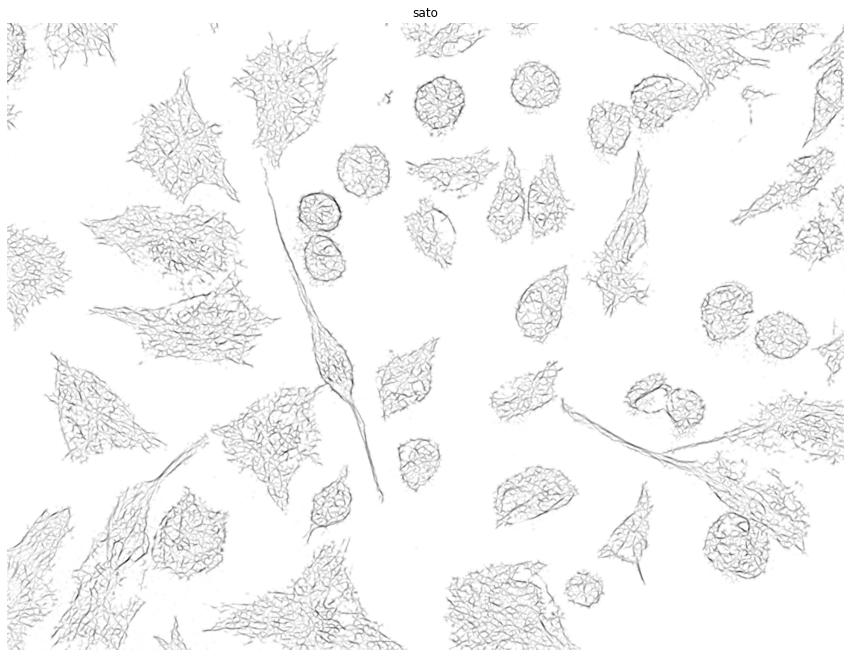

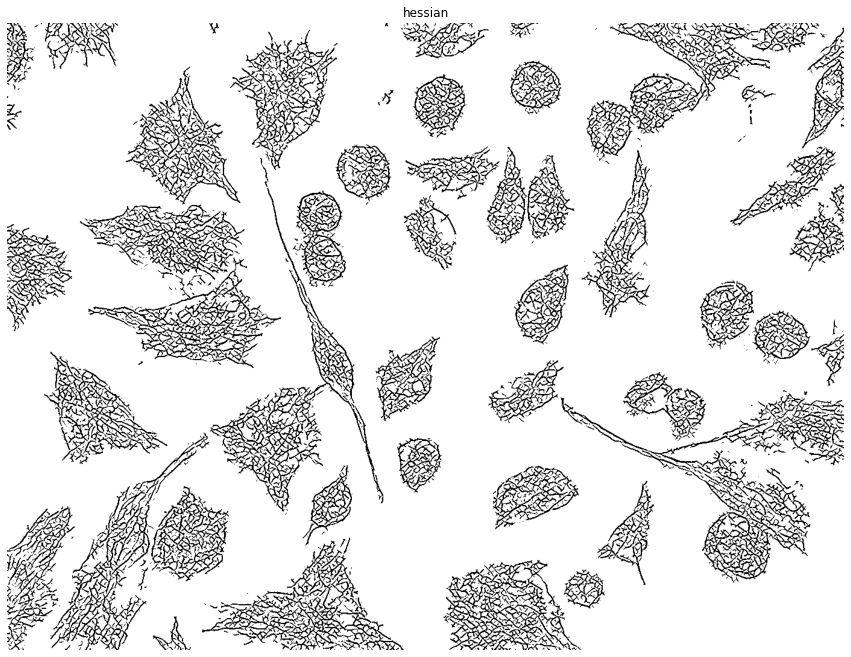

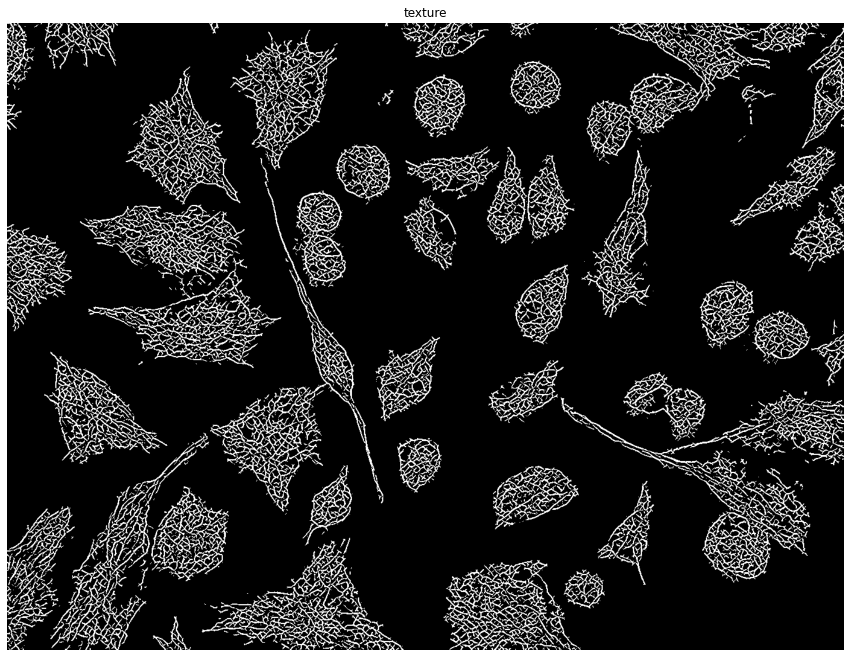

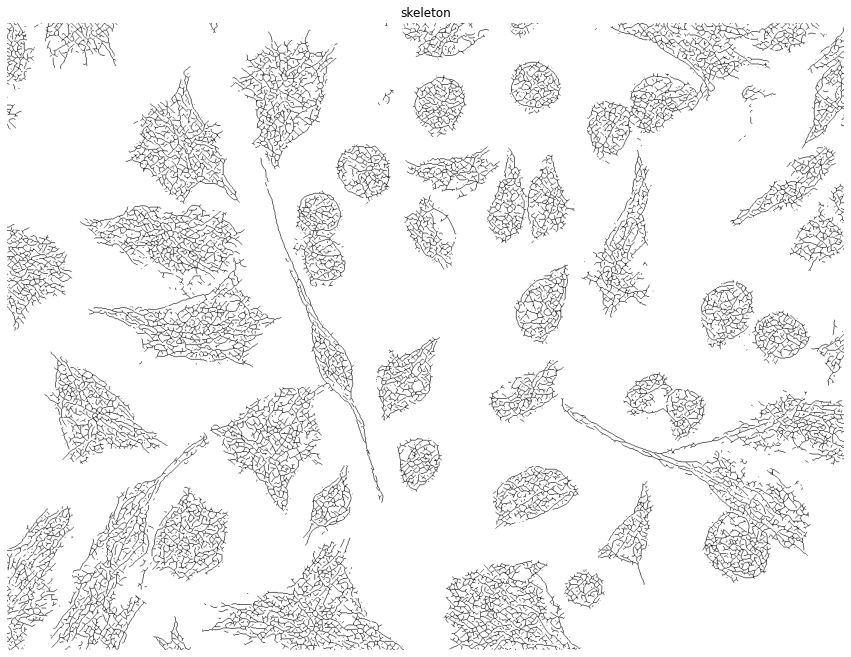

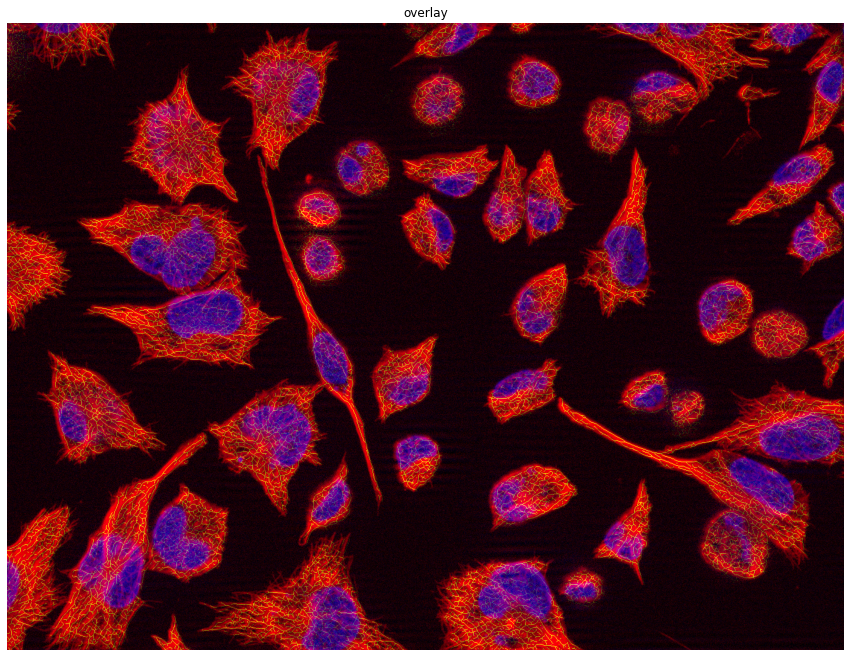

In [7]:
texture,skeleton = cytoskeleton_preprocessing([data['CYTO_DECONV'].loc[image_id]['Image'],image_id],  
                                              algorithm='new', 
                                              parameters=[0.03,500],
                                              plot=True)

In [8]:
def line_plotter(ResultsRow,TextureDF,feat,cmap,normalize_bounds,colorbar_label,overlay,save):
    %matplotlib qt
    from matplotlib.colors import LinearSegmentedColormap
    fig,ax = plt.subplots()
    
    # Plot background
    if overlay == None:
        ax.imshow(np.zeros((1040, 1388)),cmap='gray',alpha=0)
    if overlay == 'deconv':
        #ax.imshow(1-ResultsRow['Mask']*TextureDF['Skeleton'][ResultsRow['Img Index']],cmap='gray')
        ax.imshow(np.max(ResultsRow['Patch:Deconvoluted Cyto'][1]) - ResultsRow['Patch:Deconvoluted Cyto'][1],cmap='gray',zorder=2)
        
    ax.axis('off')
    ax.axis('equal')
    
    # Get bounds for color map (either 'default' or [0,90], etc)
    if normalize_bounds == 'default':
        normalize_bounds = [0,np.max(ResultsRow[feat])]

    # Plot Nucleus Centroid and Cytoskeleton Centroid
    #ax.plot(ResultsRow['Nucleus Centroid'][1],ResultsRow['Nucleus Centroid'][0],'.',color='#6495ED',markersize=5,zorder=8)
    #ax.plot(ResultsRow['Nucleus Centroid'][1],ResultsRow['Nucleus Centroid'][0],'o',color='#6495ED',markersize=15,zorder=8,fillstyle='none')
    #ax.plot(ResultsRow['Nucleus Centroid'][1],ResultsRow['Nucleus Centroid'][0],'o',color='#6495ED',markersize=12,zorder=8)
    
    #ax.plot(ResultsRow['Cytoskeleton Centroid'][1],ResultsRow['Cytoskeleton Centroid'][0],'.',color='r',markersize=5,zorder=8)
    #ax.plot(ResultsRow['Cytoskeleton Centroid'][1],ResultsRow['Cytoskeleton Centroid'][0],'o',color='r',markersize=15,zorder=8,fillstyle='none',)
    #ax.plot(ResultsRow['Cytoskeleton Centroid'][1],ResultsRow['Cytoskeleton Centroid'][0],'o',color='r',markersize=12,zorder=8)
    
    # Plot Nucleus Contour
    #ax.plot(ResultsRow['Nucleus Contour'][:,0],ResultsRow['Nucleus Contour'][:,1],'--',color='#6495ED',zorder=11,linewidth=2.5)
    #plot_nuclei_contours(CentroidsDF,ResultsRow['Img Index'],ax) 
        
        
    # Plot segments colored by feature value
    #cmap     = pltc.rainbow_r
    #cmap = pltc.hsv
    
    for l in range(len(ResultsRow['Lines'])):
            # Get line = [p0,p1]. 
            p0, p1 = ResultsRow['Lines'][l]
            
            if feat != None:
                colour   = cmap(plt.Normalize(normalize_bounds[0], normalize_bounds[1])(ResultsRow[feat][l]))
                ax.plot((p0[0], p1[0]), (p0[1], p1[1]),linewidth=2,color=colour,alpha=1)
            else:
                cmap = pltc.rainbow_r
                ax.plot((p0[0], p1[0]), (p0[1], p1[1]),linewidth=2,color=cmap(0),alpha=1,zorder=5)
                
    
    
    # Colorbar
    if colorbar_label != None:
        cbar = fig.colorbar(pltc.ScalarMappable(norm=plt.Normalize(normalize_bounds[0], normalize_bounds[1]), cmap=cmap), ax=ax, shrink = 0.4)
        cbar.set_label(colorbar_label,fontfamily='arial',fontsize=12)
        #cbar.set_ticks(np.linspace(0,90,10,endpoint=True))

    # Scale Bar
#     scalebar = ScaleBar(1,"um",color='k',box_alpha=0,dimension='si-length',location='lower right') 
#     ax.add_artist(scalebar)

    # Set x and y lims and title
    x_,y_   = np.where((ResultsRow['Mask']*1) != 0)
    ax.set_ylim([min(x_),max(x_)])
    ax.set_xlim([min(y_),max(y_)])
    #ax.set_title(feat,fontsize=12)
    
    # Adjust and Show
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    if save != False:
        plt.savefig(folder + str("\\") + str(save) + ".png",format='png',transparent=True,bbox_inches='tight',dpi=500)
    fig.show()
    
    return print('Done.')

In [9]:
cell = 930
#TextureDF = pd.DataFrame(columns=['Name','Index','Label','Skeleton'])
new       = pd.DataFrame(data={'Index': [9], 'Label': ['WT'], 'Skeleton': [skeleton*1]}, index = [930])
TextureDF = pd.concat([TextureDF, new],ignore_index=False)
#ResultsDF = pd.read_pickle("ResultsDF_LSD_Last2.p")


In [10]:
cmap     = pltc.rainbow
cm       = truncate_colormap(cmap, 0, 1, 300)
line_plotter(ResultsRow=ResultsDF.loc[cell],TextureDF=TextureDF,feat=None,cmap=cm,normalize_bounds=1,colorbar_label=None,overlay=True,save='preprocessing_cellX_lines_paper')

NameError: name 'ResultsDF' is not defined

In [58]:
TextureDF.to_pickle("./TextureDF_paper.pkl")

In [57]:
TextureDF 

,Name,Index,Label,Skeleton
144,NaN,11,WT,"[[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,..."
145,NaN,11,WT,"[[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,..."
939,NaN,9,WT,"[[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,..."


In [46]:
cmap     = pltc.rainbow
cm       = truncate_colormap(cmap, 0, 1, 300)
%matplotlib qt
line_plotter(ResultsRow=ResultsDF.loc[cell],TextureDF=TextureDF,feat=None,cmap=cm,normalize_bounds=1,colorbar_label=None,overlay=True,save='preprocessing_cellB_lines_paper')

ImportError: Failed to import any qt binding

In [14]:
thresh = threshold_otsu(s)
binary_ori = s > thresh*0.2

sk = skeletonize(binary_ori) 

test3 = np.stack([sk*255,data['RGB']['Image'][INDEX][:,:,2],data['RGB']['Image'][INDEX][:,:,1]],axis=2)
ske = np.stack([sk*255,data['RGB']['Image'][INDEX][:,:,1],np.zeros_like(sk)],axis=2)

plt.figure(figsize=(15,15))
plt.imshow(test3,cmap='gray')
plt.show()

# <font color='red'>TESTS</font>

In [ ]:
def plot_overlayed_sk(img_id,image,sk):
    

In [6]:
INDEX = 11
sk = TextureDF['Skeleton'][INDEX]
grey = data['RGB']['Image'][INDEX][:,:,2]


#test3 = np.stack([1.3*(grey / np.max(grey)),1.5*sk*(grey / np.max(grey)), 0.4 * (data['RGB']['Image'][INDEX][:,:,0] / np.max(data['RGB']['Image'][INDEX][:,:,0]))],axis=2)
#test3 = np.stack([grey,np.zeros_like(OriginalDF['Image'][INDEX][:,:,2]),np.zeros_like(OriginalDF['Image'][INDEX][:,:,2])],axis=2)

mult = np.stack([1*(grey / np.max(grey)),sk*(grey / np.max(grey)), 0.6 * (data['RGB']['Image'][INDEX][:,:,0] / np.max(data['RGB']['Image'][INDEX][:,:,0]))],axis=2)
#test3 = np.stack([1.5*(grey / np.max(grey)),sk, 0.2 * (data['RGB']['Image'][INDEX][:,:,0] / np.max(data['RGB']['Image'][INDEX][:,:,0]))],axis=2)

%matplotlib qt
plt.figure()
plt.axis('equal')
plt.axis('off')
plt.imshow(mult)
plt.savefig(folder + "//cyto_nuc_skel_11.png",format='png',transparent=True,bbox_inches='tight',dpi=500)
plt.show()

In [9]:
from scipy.ndimage import convolve
from skimage.filters import meijering, sato, frangi, hessian, threshold_otsu, laplace, threshold_yen, rank
from skimage.util import img_as_ubyte
from skimage.morphology import extrema, skeletonize, disk
from skimage import filters

# ------------------
INDEX = 11
SAVE  = False
# ------------------

# Original Image
img = data['RGB']['Image'][INDEX]

# Remove blue channel and convert to grayscale
tmp        = copy.deepcopy(img)
tmp[:,:,0] = 0
grey       = cv2.cvtColor(tmp,cv2.COLOR_RGB2GRAY)

# Yen thresholding for low intensity noise removal
thresh = threshold_yen(grey)
binary = grey > thresh*0.25
temp   = binary * grey

# Deconvolution
kernel = np.array([[-1, -1, -1],[-1, 17, -1], [-1,-1, -1]])*1/9
#kernel = np.array([[-1, -1, -1],[-1, 12, -1], [-1,-1, -1]])
#kernel = np.array([[0.17 , 0.67 , 0.17] , [0.67, 2.33 , 0.67], [0.17, 0.67, 0.17]])
#kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])

# Deconvolution with chosen kernel
a = cv2.filter2D(src=temp , ddepth=-1, kernel=kernel)


h = hessian(a,black_ridges=False,sigmas=[2],mode='reflect')
h = 1 - h.astype(np.uint8)

skeleton_pre = skeletonize(h)

# Contour Removal
contours, hierarchy = cv2.findContours((skeleton_pre*1).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  

# Filter contours with area above certain threshold
remo_contours = []
for contour in contours:
    if len(contour) <= 1:
        remo_contours.append(contour)
removed_out = np.zeros_like(h)
cv2.fillPoly(removed_out, pts = remo_contours, color=(255,255,255))

# Get final skeleton
sk = skeleton_pre*1 - removed_out/255
 


test3 = np.stack([1.3*(grey / np.max(grey)),1.5*sk*(grey / np.max(grey)), 0.4 * (data['RGB']['Image'][INDEX][:,:,0] / np.max(data['RGB']['Image'][INDEX][:,:,0]))],axis=2)
#test3 = np.stack([grey,np.zeros_like(OriginalDF['Image'][INDEX][:,:,2]),np.zeros_like(OriginalDF['Image'][INDEX][:,:,2])],axis=2)

mult = np.stack([0.9*(grey / np.max(grey)),sk*(grey / np.max(grey)), 0.4 * (data['RGB']['Image'][INDEX][:,:,0] / np.max(data['RGB']['Image'][INDEX][:,:,0]))],axis=2)
#test3 = np.stack([1.5*(grey / np.max(grey)),sk, 0.2 * (data['RGB']['Image'][INDEX][:,:,0] / np.max(data['RGB']['Image'][INDEX][:,:,0]))],axis=2)


#sk*np.max(OriginalDF['Image'][INDEX])


# Convolution
#a = convolve(temp / np.max(temp), kernel)



#gau = gaussian_filter(temp, sigma=0.1)

# Sato filter
# s = sato(a,black_ridges=False,sigmas=[3],mode='reflect') 


# #kernel = np.array([[-1, -1, -1],[-1, 12, -1], [-1,-1, -1]])
# #kernel = np.array([[0.17 , 0.67 , 0.17] , [0.67, 2.33 , 0.67], [0.17, 0.67, 0.17]])
# kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])


# a = cv2.filter2D(src=DeconvDF['Image'][11] , ddepth=-1, kernel=kernel)

# s = sato(a,black_ridges=False,sigmas=[1],mode='reflect') 
# thresh_ori = threshold_yen(s)
# binary_ori = s > thresh_ori*0.2
# temp       = binary_ori * s
# b = cv2.filter2D(src=temp , ddepth=-1, kernel=kernel)
# h = hessian(b,black_ridges=False,sigmas=[0.006],mode='reflect') 
# texture = ((1 - h)!=0)*1
# skeleton = skeletonize(texture)

%matplotlib qt
# plt.figure(figsize=(15,15)); plt.title('Original');                      plt.imshow(grey,cmap='gray'); 
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Otsu');                          plt.imshow(temp,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Deconvoluted');                  plt.imshow(a,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Hessian');                       plt.imshow(h,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Skeleton');                      plt.imshow(skeleton_pre,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Skeleton Processed');            plt.imshow(sk,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Removed Contours');              plt.imshow(removed_out,cmap='gray');
# plt.show()
plt.figure(figsize=(15,15));                                             plt.imshow(test3,cmap='gray');
plt.axis('off')
#plt.savefig("contest.png",format='png',transparent=True,bbox_inches='tight',dpi=800)
#plt.show()

# plt.figure(figsize=(15,15)); plt.title('Tester');                        plt.imshow(mult,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Sato -> Laplace');               plt.imshow(mult,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Laplace -> CLAHE');              plt.imshow(l,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('CLAHE -> Otsu and Hyst. Thr.');  plt.imshow(minima,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('Otsu and Hyst. Thr. -> Yen Thr -> * by temp -> TEXTURE'); plt.imshow(texture,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('TEXTURE -> SKELETON');           plt.imshow(skeleton_pre,cmap='gray');
# plt.show()
# plt.figure(figsize=(15,15)); plt.title('SKELETON -> SKELETON FILT.');    plt.imshow(skeleton,cmap='gray');
# plt.show()



plt.savefig("contest.png",format='png',transparent=True,bbox_inches='tight',dpi=1500)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [145]:
from scipy.ndimage import convolve
from skimage.filters import meijering, sato, frangi, hessian, threshold_otsu, laplace, threshold_yen, rank
from skimage.util import img_as_ubyte
from skimage.morphology import extrema, skeletonize, disk
from skimage import filters

# ------------------
INDEX    = OriginalDF.index[16]
SAVE     = False
THR_FRAC = 0.9
# ------------------

# Original Image
img = OriginalDF['Image'][INDEX]

# Remove blue channel and convert to grayscale
tmp        = copy.deepcopy(img)
tmp[:,:,0] = 0
grey       = cv2.cvtColor(tmp,cv2.COLOR_RGB2GRAY)

# Yen thresholding for low intensity noise removal
thresh = threshold_yen(grey)
binary = grey > thresh*THR_FRAC
temp   = binary * grey

# Deconvolution
kernel = np.array([[-1, -1, -1],[-1, 17, -1], [-1,-1, -1]])*1/9
dec = cv2.filter2D(src=temp , ddepth=-1, kernel=kernel)


h = hessian(dec,black_ridges=False,sigmas=[2],mode='reflect')
h = 1 - h.astype(np.uint8)

skeleton_pre = skeletonize(h)

# Contour Removal
contours, hierarchy = cv2.findContours((skeleton_pre*1).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  

# Filter contours with area above certain threshold
remo_contours = []
for contour in contours:
    if len(contour) <= 1:
        remo_contours.append(contour)
removed_out = np.zeros_like(h)
cv2.fillPoly(removed_out, pts = remo_contours, color=(255,255,255))

# Get final skeleton
skeleton = skeleton_pre*1 - removed_out/255
 
if SAVE:
    # Add to DataFrame
    new       = pd.DataFrame(data={'Name': [OriginalDF['Name'][INDEX]], 'Index': [INDEX], 'Label': [OriginalDF['Label'][INDEX]], 'Skeleton': [skeleton]}, index = [INDEX])
    TextureDF = TextureDF.append(new,ignore_index=False)
    plt.figure()
    plt.imshow(TextureDF.loc[INDEX]['Skeleton'])
    plt.show()
TextureDF

,Name,Index,Label,Skeleton
11,10_6IF_CHO_L_w3_(DAPI+Alexa 568)_PS.tif,11,WT,"[[0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0,..."
16,15_IF6_CHO_L-W1_(DAPI+Alexa 568)_PS.tif,16,Mock,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
18,17_IF6_CHO_L-W1_(DAPI+Alexa 568)_PS.tif,18,Mock,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0,..."
20,19_IF6_CHO_L-W1_(DAPI+Alexa 568)_PS.tif,20,Mock,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
34,33_IF6_CHO_L-W5_(DAPI+Alexa 568)_PS.tif,34,No transfection,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
36,35_IF6_CHO_L-W5_(DAPI+Alexa 568)_PS.tif,36,No transfection,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
38,37_IF6_CHO_L-W5_(DAPI+Alexa 568)_PS.tif,38,No transfection,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
40,39_IF6_CHO_L-W6_(DAPI+Alexa 568)_PS.tif,40,Del38_46,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
42,41_IF6_CHO_L-W6_(DAPI+Alexa 568)_PS.tif,42,Del38_46,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
44,43_IF6_CHO_L-W6_(DAPI+Alexa 568)_PS.tif,44,Del38_46,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [146]:
TextureDF.to_pickle(".//TextureDF_sub.pkl") 

In [147]:
TextureDF = pd.read_pickle(os.getcwd() + "\\TextureDF_sub.pkl")   

In [1]:
from skimage.morphology import medial_axis, skeletonize, skeletonize_3d
from skimage.morphology import skeletonize, thin

%matplotlib qt

mult = texture * row['Image']
ya = skeletonize_3d(mult)
skel, distance = medial_axis(mult, return_distance=True)
thinned = thin(mult)
#thinned_partial = thin(image, max_iter=25)

clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
cl_img = clahe.apply(row['Image'])

otsu = threshold_otsu(cl_img)
test = cl_img > otsu



plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(mult,cmap='gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(row['Image'],cmap='gray')
plt.axis('off')
plt.tight_layout()
plt.show()


NameError: name 'texture' is not defined

In [20]:
def parameters(scale,sigma_scale,quant,ang_th,log_eps,density,n_bins):
    #im = skel[515:665,600:720]
    im = skel[50:320,150:400]
    lsd = cv2.createLineSegmentDetector(cv2.LSD_REFINE_ADV,scale,sigma_scale,quant,ang_th,log_eps,density,n_bins)
    lines = cv2toski(lsd.detect((im * 255).astype(np.uint8))[0])
    global prec,width
    prec = lsd.detect((im * 255).astype(np.uint8))[2]
    width = lsd.detect((im * 255).astype(np.uint8))[1]

    %matplotlib qt
    plt.figure(figsize=(10,10))
    plt.imshow(im,cmap='gray')
    ind = 0
    for line in lines:
        p0, p1 = line
        cmap = pltc.cool
        plt.plot((p0[0], p1[0]), (p0[1], p1[1]),linewidth=2,color=cmap(plt.Normalize(0, 1)(prec[ind])))
        ind = ind + 1
        plt.tight_layout()

    plt.axis('off')
    print('done')
    plt.show()

interact(parameters,scale=2.5,sigma_scale=0.001,quant=0,ang_th=90,log_eps=-200,density=0.5,n_bins=2048)

interactive(children=(FloatSlider(value=2.5, description='scale', max=7.5, min=-2.5), FloatSlider(value=0.001,…

<function __main__.parameters(scale, sigma_scale, quant, ang_th, log_eps, density, n_bins)>

In [8]:
def parameters(sigmas):
    %matplotlib qt
    
    s = sato(gau,black_ridges=False,sigmas=[sigmas]) 

    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.imshow(data['Image'],cmap='gray') #row['Image']
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(s,cmap='gray')
    plt.axis('off')
    plt.tight_layout()
    plt.show()



plt.figure(figsize=(10,10))
interact(parameters, sigmas=(0.01,2,0.05) );


C:\Users\diogo\anaconda3\envs\Cytosk_recentpy\lib\site-packages\ipykernel\pylab\backend_inline.py:10: DeprecationWarning: `ipykernel.pylab.backend_inline` is deprecated, directly use `matplotlib_inline.backend_inline`
  warnings.warn(


<Figure size 1000x1000 with 0 Axes>

interactive(children=(FloatSlider(value=0.9600000000000001, description='sigmas', max=2.0, min=0.01, step=0.05…

In [586]:
from skimage.filters import sobel_h,sobel_v,laplace
from skimage.morphology import skeletonize, thin, skeletonize_3d
from skimage.filters import threshold_yen

### ---
INDEX = 9
### ---

# ### PRIMEIRA PARTE - MÉTODO 1
# LABTEST = copy.deepcopy(OriginalDF['Image'][INDEX])
# LABTEST[:,:,0] = 0
# lab    = cv2.cvtColor(LABTEST, cv2.COLOR_BGR2LAB)
# clahe  = cv2.createCLAHE(clipLimit =0.1, tileGridSize=(30,30))
# lab[:,:,0] = clahe.apply(lab[:,:,0])
# enhanced_img = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
# gra = cv2.cvtColor(enhanced_img,cv2.COLOR_RGB2GRAY)

# ori_g = gaussian_filter(gra, sigma=0.1)
# thresh_ori = threshold_otsu(ori_g)
# binary_ori = gra > thresh_ori*0.8
# temp = binary_ori * gra

# gau = gaussian_filter(temp, sigma=1)
# ### --------------------------

### PRIMEIRA PARTE - MÉTODO 2



tmp = copy.deepcopy(OriginalDF.loc[INDEX]['Image'])
tmp[:,:,0] = 0
grey = cv2.cvtColor(tmp,cv2.COLOR_RGB2GRAY)
grey = rank.median(img_as_ubyte(grey), disk(2))
clahe  = cv2.createCLAHE(clipLimit =2, tileGridSize=(8,8))
gra = clahe.apply(grey)
#ori_g = gaussian_filter(grey, sigma=1)
thresh_ori = threshold_otsu(gra)
binary_ori = gra > thresh_ori*0.8
temp = binary_ori * gra

gau = gaussian_filter(temp, sigma=0.1)
### --------------------------



s = sato(gau,black_ridges=False,sigmas=[3],mode='reflect') 

# LAPLACIAN OPERATOR
d = laplace(s)

# CLAHE
clahe  = cv2.createCLAHE(clipLimit =2, tileGridSize=(8,8))
e = clahe.apply(((d - d.min()) * (1/(d.max() - d.min()) * 255)).astype('uint8'))

# OTSU
thresh_ori = threshold_otsu(e)
binary_ori = e > thresh_ori
f = binary_ori * e

# NEXT
from skimage import data, filters
low = 0
high = 1

lowt = (f > low).astype(int)
hight = (f > high).astype(int)
minima = filters.apply_hysteresis_threshold(f, low, high)

# ax[0, 0].imshow(image, cmap='gray')
# ax[0, 0].set_title('Original image')

# ax[0, 1].imshow(edges, cmap='magma')
# ax[0, 1].set_title('Sobel edges')

# ax[1, 0].imshow(lowt, cmap='magma')
# ax[1, 0].set_title('Low threshold')

# ax[1, 1].imshow(hight + hyst, cmap='magma')
# ax[1, 1].set_title('Hysteresis threshold')
#minima = frangi(f,black_ridges=False,sigmas=[3],mode='reflect') 


# PROBLEMA: BACKGROUND COLOR NOS ~150 EM VEZ DE 0. COMO CORRIGIR? YEN NÃO FUNCIONA BEM PARA FIBRAS MENOS INTENSAS
thresh_yen = threshold_yen(minima)
binary_yen = minima > thresh_yen
g = binary_yen * minima

# OVERVIEW

plt.close('all')
plt.figure(figsize=(15,15))
plt.imshow(gra,cmap='gray')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(grey,cmap='gray')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(s,cmap='gray')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(d,cmap='gray')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(e,cmap='gray')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(f,cmap='gray')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(minima,cmap='gray')
plt.show()
plt.figure(figsize=(15,15))
if len(np.where(minima*1 == 1)[0]) > len(np.where(minima*1 == 0)[0]):
    plt.imshow(skeletonize(1-minima*1),cmap='gray')
else:
    plt.imshow(skeletonize(minima*1),cmap='gray')
plt.show()



In [614]:
from skimage.filters import laplace
from skimage.filters import threshold_yen
from skimage import filters

### ---
INDEX = 36
### ---

# Remove blue channel and convert to grayscale
tmp        = copy.deepcopy(OriginalDF.loc[INDEX]['Image'])
tmp[:,:,0] = 0
grey       = cv2.cvtColor(tmp,cv2.COLOR_RGB2GRAY)

# Median filter for noise removal
grey_       = rank.median(img_as_ubyte(grey), disk(2))

# CLAHE for color adjustment
clahe      = cv2.createCLAHE(clipLimit = 2, tileGridSize = (8,8))
gra        = clahe.apply(grey_)

# Gaussian filter and Otsu thresholding
thresh_ori = threshold_otsu(gra)
binary_ori = gra > thresh_ori*0.8
temp       = binary_ori * gra
gau = gaussian_filter(temp, sigma=0.1)

# Sato filter
s = sato(temp,black_ridges=False,sigmas=[3],mode='reflect') 

# LAPLACIAN OPERATOR
d = laplace(s)

# CLAHE
clahe  = cv2.createCLAHE(clipLimit =2, tileGridSize=(8,8))
e = clahe.apply(((d - d.min()) * (1/(d.max() - d.min()) * 255)).astype('uint8'))

# OTSU
thresh_ori = threshold_otsu(e)
binary_ori = e > thresh_ori
f = binary_ori * e

# HYSTERESIS THRESHOLDING
low = 0
high = 1
minima = filters.apply_hysteresis_threshold(f, low, high)

# Yen thresholding
# PROBLEMA: BACKGROUND COLOR NOS ~150 EM VEZ DE 0. COMO CORRIGIR? YEN NÃO FUNCIONA BEM PARA FIBRAS MENOS INTENSAS
thresh_yen = threshold_yen(minima)
binary_yen = minima > thresh_yen
texture_pre = binary_yen * minima
texture = texture_pre * temp

# Skeletonization
if len(np.where(minima*1 == 1)[0]) > len(np.where(minima*1 == 0)[0]):
    skeleton_pre = skeletonize(1-texture_pre*1)
else:
    skeleton_pre = skeletonize(texture_pre*1)
    
# Contour Detection
contours, hierarchy = cv2.findContours((skeleton_pre*1).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  

# Filter contours with area above certain threshold
remo_contours = []
for contour in contours:
    if len(contour) <= 3:
        remo_contours.append(contour)

removed_out = np.zeros_like(texture)
cv2.fillPoly(removed_out, pts = remo_contours, color=(255,255,255))

# Get final skeleton
skeleton = skeleton_pre*1 - removed_out/255


# OVERVIEW
plt.close('all')
plt.figure(figsize=(15,15))
plt.imshow(grey,cmap='gray')
plt.title('Original')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(grey_,cmap='gray')
plt.title('Original -> Median Filter')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(gra,cmap='gray')
plt.title('Median Filter -> CLAHE')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(temp,cmap='gray')
plt.title('CLAHE -> Otsu')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(gau,cmap='gray')
plt.title('Otsu -> Gaussian filter')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(s,cmap='gray')
plt.title('Gaussian filter -> Sato')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(d,cmap='gray')
plt.title('Sato -> Laplace')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(e,cmap='gray')
plt.title('Laplace -> CLAHE')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(minima,cmap='gray')
plt.title('CLAHE -> Otsu and Hysteresis Thresholding')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(texture,cmap='gray')
plt.title('Otsu and Hysteresis Thresholding -> Yen Threshold -> Mult by temp -> TEXTURE')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(skeleton_pre,cmap='gray')
plt.title('TEXTURE -> SKELETON')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(skeleton,cmap='gray')
plt.title('SKELETON -> SKELETON FILTERED')
plt.show()



In [615]:
### ---
INDEX = 36
### ---

grey       = DeconvDF.loc[INDEX]['Image']

# Median filter for noise removal
grey_       = rank.median(img_as_ubyte(grey), disk(2))

# CLAHE for color adjustment
clahe      = cv2.createCLAHE(clipLimit = 2, tileGridSize = (8,8))
gra        = clahe.apply(grey_)

# Gaussian filter and Otsu thresholding
thresh_ori = threshold_otsu(gra)
binary_ori = gra > thresh_ori*0.8
temp       = binary_ori * gra
gau = gaussian_filter(temp, sigma=0.1)

# Sato filter
s = sato(temp,black_ridges=False,sigmas=[3],mode='reflect') 

# LAPLACIAN OPERATOR
d = laplace(s)

# CLAHE
clahe  = cv2.createCLAHE(clipLimit =2, tileGridSize=(8,8))
e = clahe.apply(((d - d.min()) * (1/(d.max() - d.min()) * 255)).astype('uint8'))

# OTSU
thresh_ori = threshold_otsu(e)
binary_ori = e > thresh_ori
f = binary_ori * e

# HYSTERESIS THRESHOLDING
low = 0
high = 1
minima = filters.apply_hysteresis_threshold(f, low, high)

# Yen thresholding
# PROBLEMA: BACKGROUND COLOR NOS ~150 EM VEZ DE 0. COMO CORRIGIR? YEN NÃO FUNCIONA BEM PARA FIBRAS MENOS INTENSAS
thresh_yen = threshold_yen(minima)
binary_yen = minima > thresh_yen
texture_pre = binary_yen * minima
texture = texture_pre * temp

# Skeletonization
if len(np.where(minima*1 == 1)[0]) > len(np.where(minima*1 == 0)[0]):
    skeleton_pre = skeletonize(1-texture_pre*1)
else:
    skeleton_pre = skeletonize(texture_pre*1)
    
# Contour Detection
contours, hierarchy = cv2.findContours((skeleton_pre*1).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  

# Filter contours with area above certain threshold
remo_contours = []
for contour in contours:
    if len(contour) <= 3:
        remo_contours.append(contour)

removed_out = np.zeros_like(texture)
cv2.fillPoly(removed_out, pts = remo_contours, color=(255,255,255))

# Get final skeleton
skeleton = skeleton_pre*1 - removed_out/255


# OVERVIEW
plt.close('all')
plt.figure(figsize=(15,15))
plt.imshow(grey,cmap='gray')
plt.title('Original')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(grey_,cmap='gray')
plt.title('Original -> Median Filter')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(gra,cmap='gray')
plt.title('Median Filter -> CLAHE')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(temp,cmap='gray')
plt.title('CLAHE -> Otsu')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(gau,cmap='gray')
plt.title('Otsu -> Gaussian filter')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(s,cmap='gray')
plt.title('Gaussian filter -> Sato')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(d,cmap='gray')
plt.title('Sato -> Laplace')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(e,cmap='gray')
plt.title('Laplace -> CLAHE')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(minima,cmap='gray')
plt.title('CLAHE -> Otsu and Hysteresis Thresholding')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(texture,cmap='gray')
plt.title('Otsu and Hysteresis Thresholding -> Yen Threshold -> Mult by temp -> TEXTURE')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(skeleton_pre,cmap='gray')
plt.title('TEXTURE -> SKELETON')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(skeleton,cmap='gray')
plt.title('SKELETON -> SKELETON FILTERED')
plt.show()



In [287]:
from skimage.filters import rank
from skimage.morphology import disk
from skimage.util import img_as_ubyte
ori = OriginalDF['Image'][9][:,:,2] / np.max(OriginalDF['Image'][9][:,:,2])

clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))
cl_img = clahe.apply(OriginalDF['Image'][9][:,:,2])

ori_g = gaussian_filter(cl_img, sigma=0.1)
thresh_ori = threshold_otsu(ori_g)
binary_ori = cl_img > thresh_ori*0.3
temp = binary_ori * cl_img
denoised = rank.median(img_as_ubyte(temp), disk(2))

%matplotlib qt
plt.figure()
plt.imshow(ori,cmap='gray')
plt.show()
plt.figure()
plt.imshow(cl_img,cmap='gray')
plt.show()
plt.figure()
plt.imshow(denoised,cmap='gray')
plt.show()

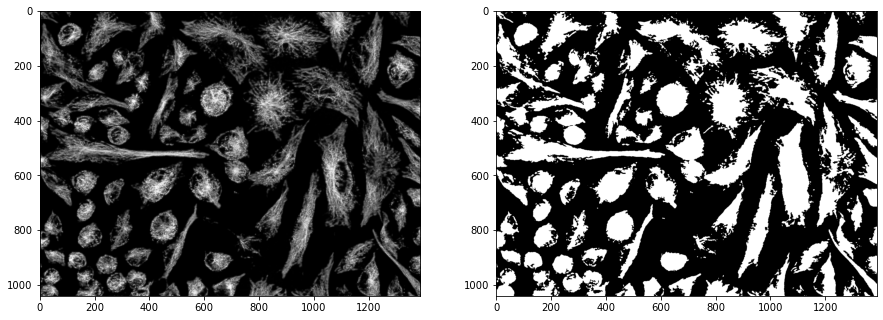

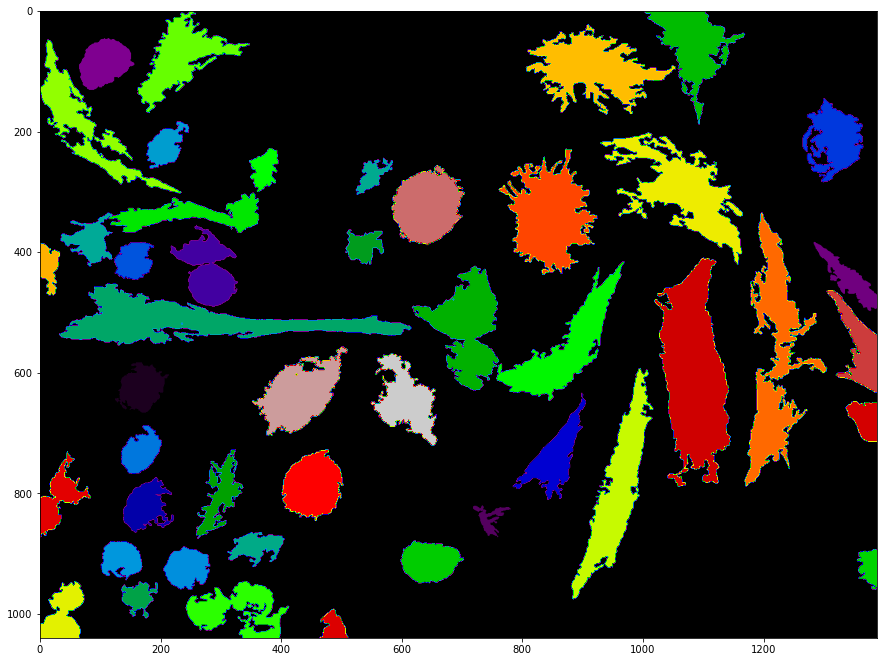

In [96]:
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

from skimage.morphology import area_closing

row = DeconvDF.loc[11]
image = row['Image'] / np.max(row['Image'])
n_cents = len(Centroids[row.name])


thresh = threshold_otsu(image)
binary = image > thresh*0.9

closed = area_closing(binary, 10000)
#closed = area_closing(texture, 1000)

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(image,cmap='gray')
plt.subplot(1,2,2)
plt.imshow(closed,cmap='gray')
plt.show()

distance = ndi.distance_transform_edt(closed)
coords = peak_local_max(distance, footprint=np.ones((200, 200)), labels=closed)
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(coords.T)] = True

markers, _ = ndi.label(mask)

markers = np.zeros_like(image)
l = 1
for index,row_ in Centroids[row.name].iterrows():
    markers[int(row_['Centroid'][0]),int(row_['Centroid'][1])] = l
    l+=1
    

labels = watershed(-distance, markers, mask=closed,watershed_line=True)

plt.figure(figsize=(15,15))
#plt.imshow(-distance, cmap=plt.cm.gray)
plt.imshow(labels, cmap=plt.cm.nipy_spectral)
plt.show()

## 5.x Plot proposed texture fields

In [21]:
s = 1
plt.figure(figsize=(13,5*len(TextureDF)))
for index, row in TextureDF.iterrows():
    # DECONVOLUTED
    plt.subplot(len(TextureDF),2,s)
    plt.imshow(DeconvDF['Image'][index],cmap='gray')
    plt.axis('off')
    plt.title("DECONVOLUTED - Mutation: " + row['Label'] + " / image ID: " + str(index),fontsize=10)
    s += 1
    plt.tight_layout()
    
    # TEXTURE FIELDS
    plt.subplot(len(TextureDF),2,s)
    plt.imshow(row['Image'],cmap='gray')
    plt.axis('off')
    plt.title("PROPOSED TEXTURAL FIELD - Mutation: " + row['Label'] + " / image ID: " + str(index),fontsize=10)
    s += 1
    plt.tight_layout() 
    

KeyError: (7786,)

ValueError: Image size of 936x8994240 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 936x8.99424e+06 with 1 Axes>

## 5.x Hough transform

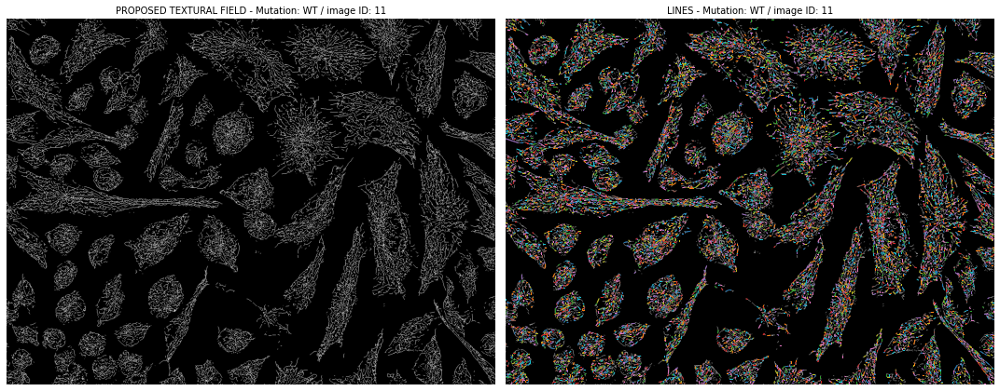

11 done


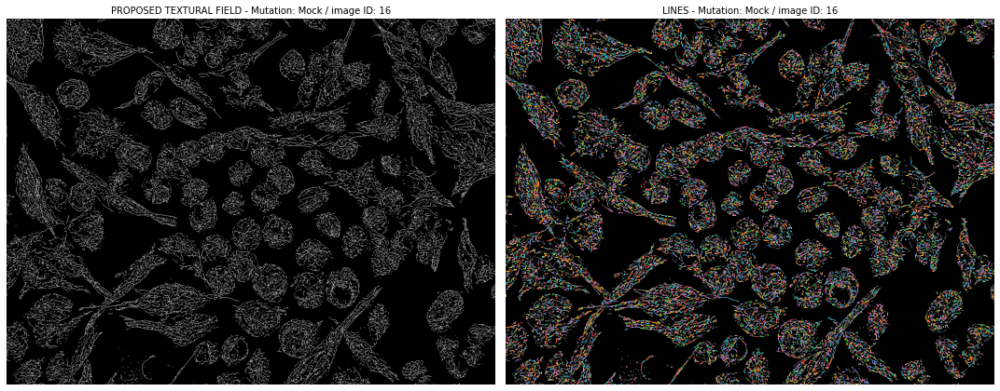

16 done


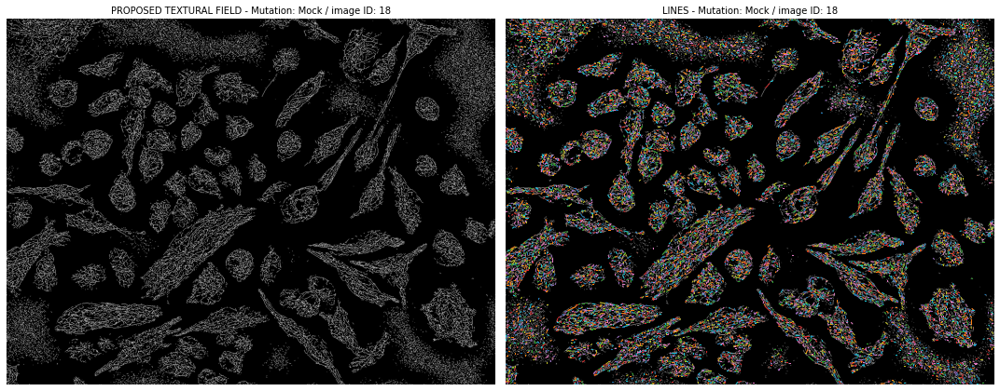

18 done


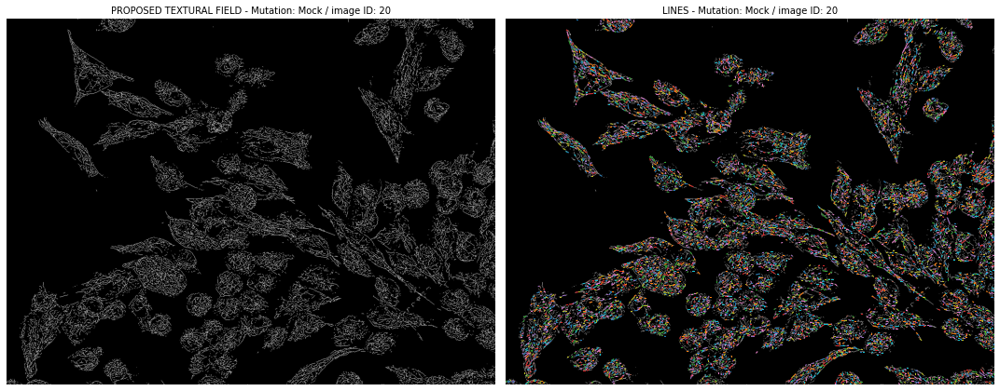

20 done


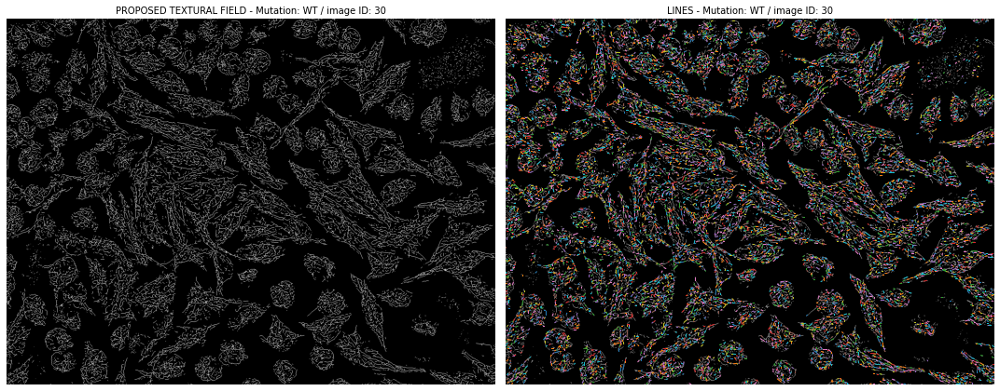

30 done


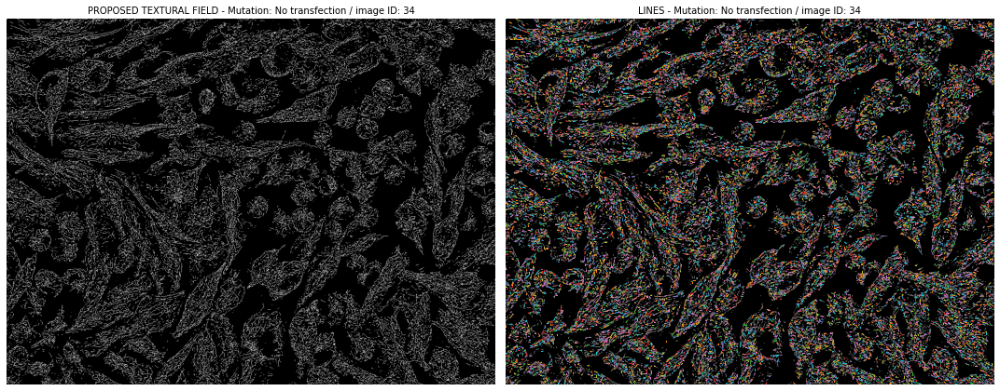

34 done


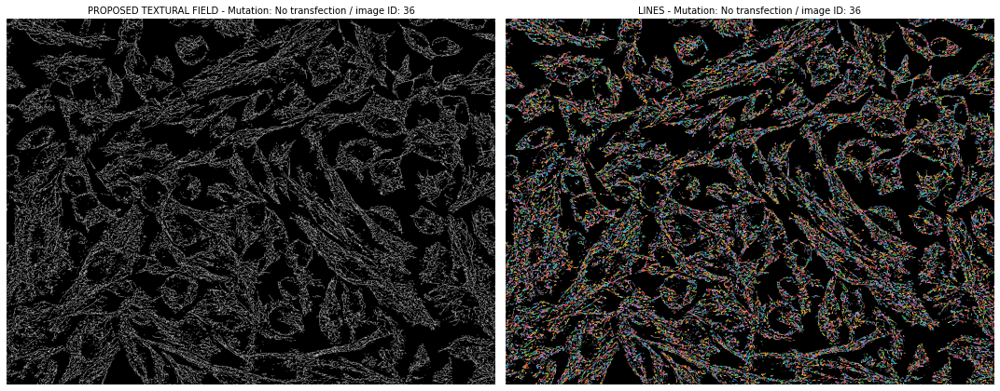

36 done


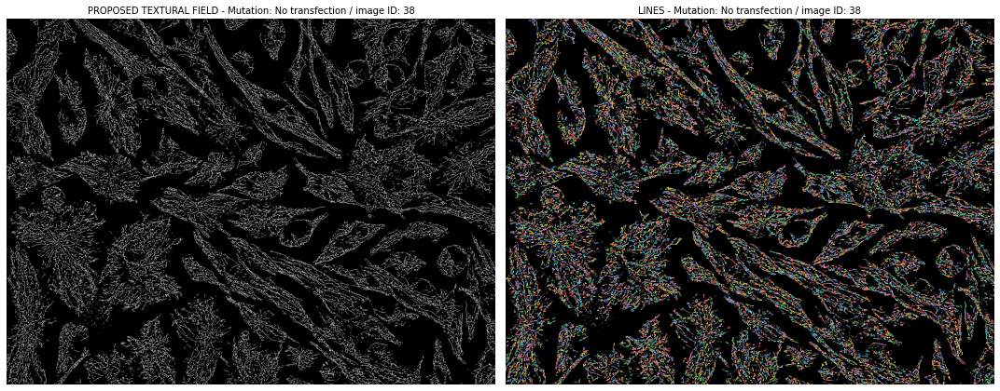

38 done


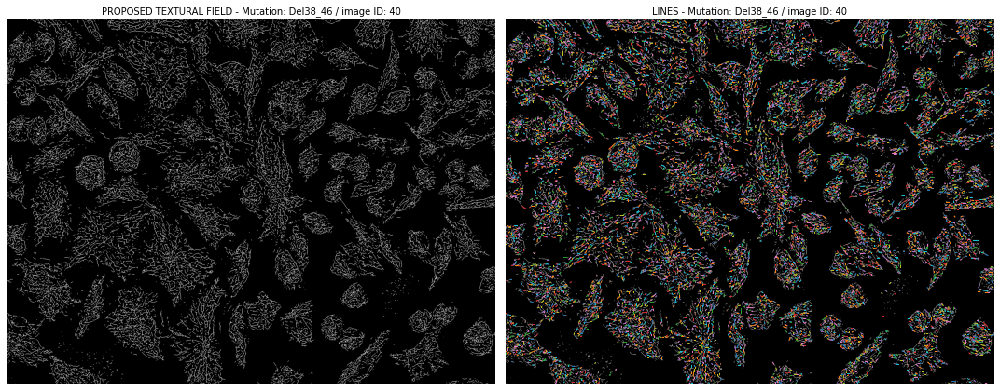

40 done


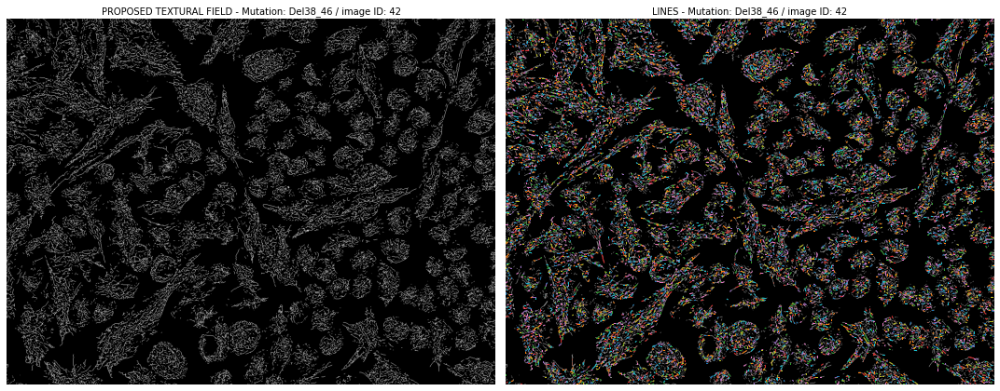

42 done


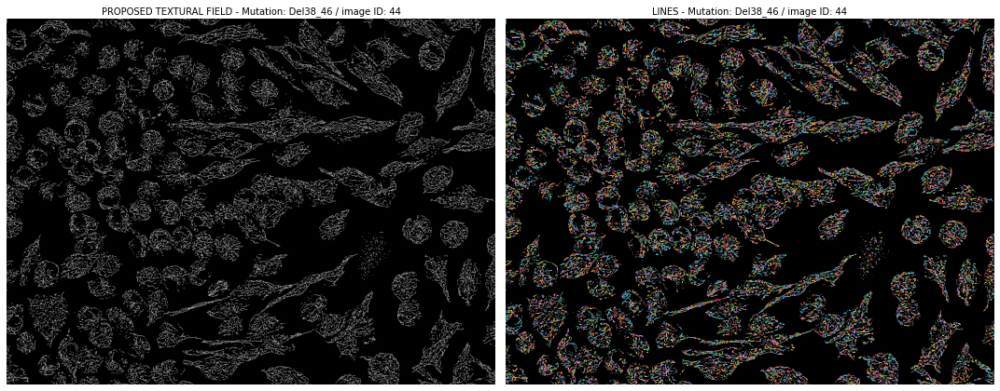

44 done


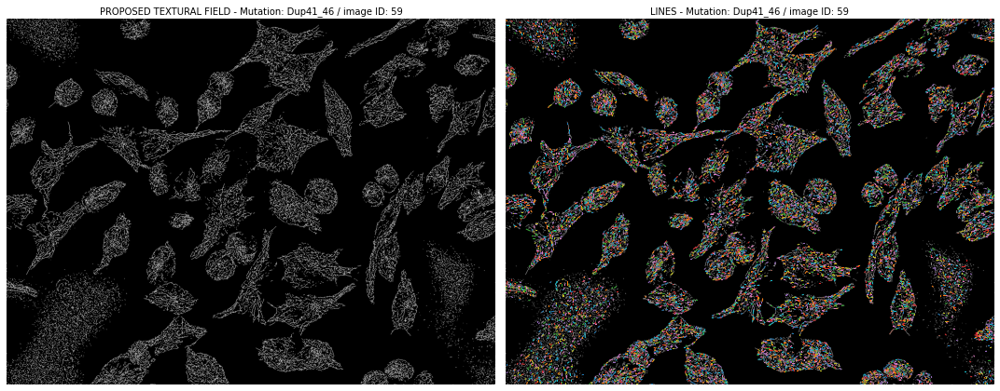

59 done


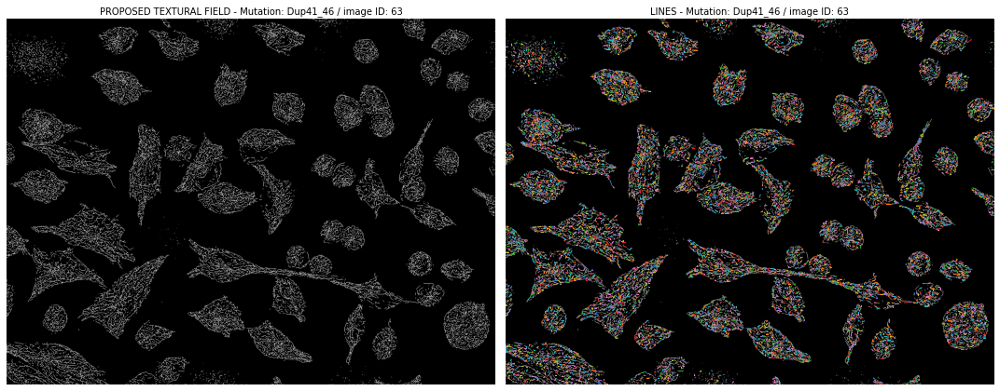

63 done


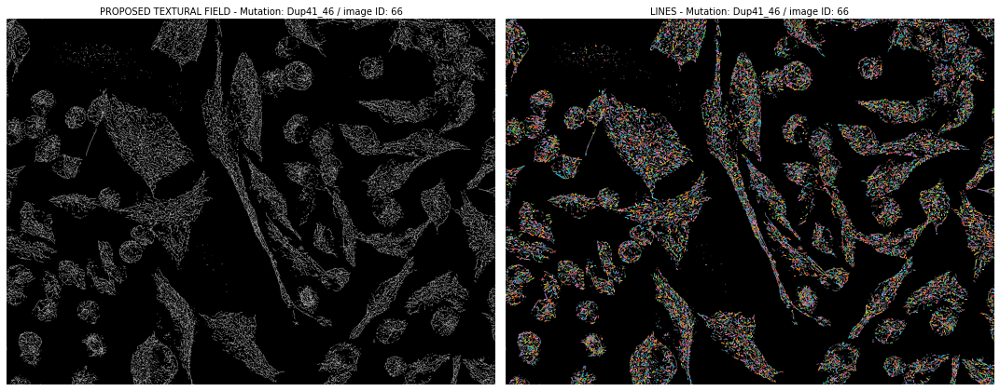

66 done


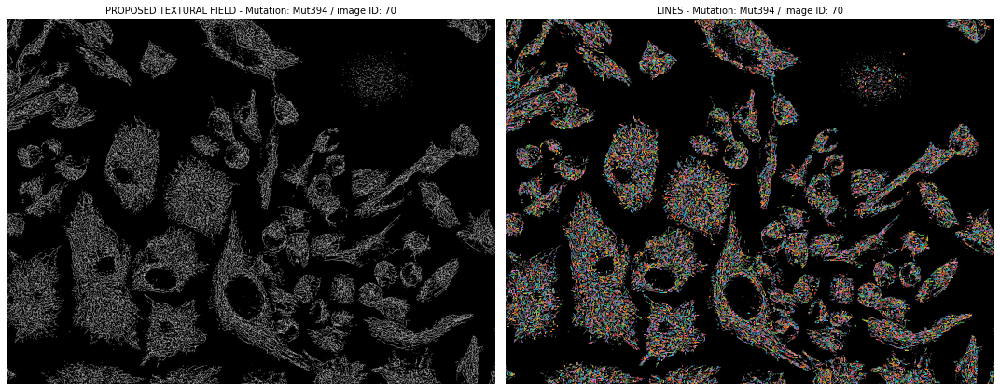

70 done


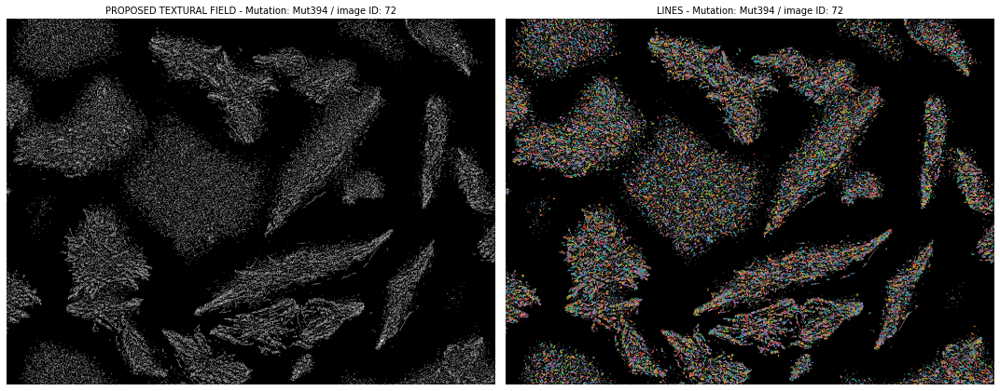

72 done


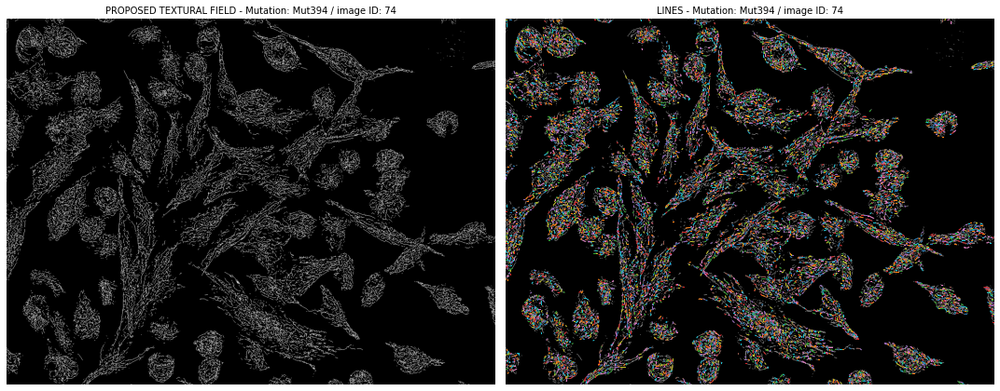

74 done


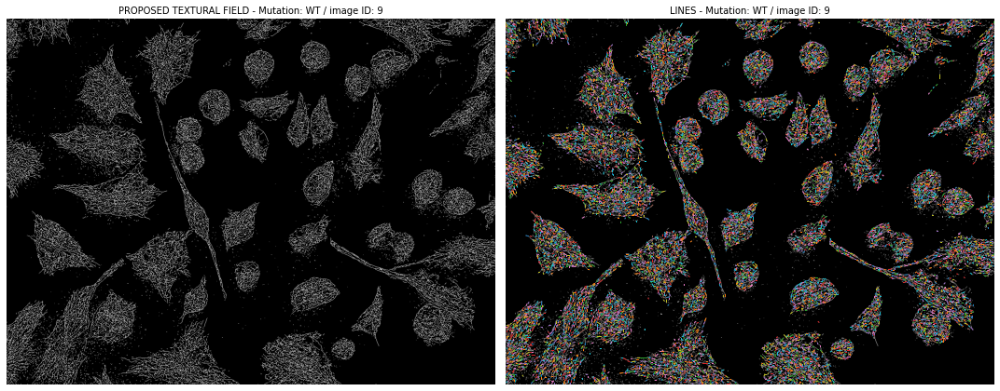

9 done


In [149]:
s = 1
#plt.figure(figsize=(15,5*len(TextureDF)))
#HoughDF = pd.DataFrame(columns=['Name','Label','Lines'])

for index, row in TextureDF.iterrows():
    plt.figure(figsize=(15,15))
    
    # TEXTURE FIELDS
    plt.subplot(1,2,1)
    plt.imshow(row['Image'],cmap='gray')
    plt.axis('off')
    plt.title("PROPOSED TEXTURAL FIELD - Mutation: " + row['Label'] + " / image ID: " + str(index),fontsize=10)
    s += 1
    plt.tight_layout()  
    
    # LINES
    plt.subplot(1,2,2)
    plt.imshow(row['Image'],cmap='gray')
    plt.axis('off')
    plt.title("LINES - Mutation: " + row['Label'] + " / image ID: " + str(index),fontsize=10)
    
    # Hough transform
    threshold   = 0
    line_length = 2
    line_gap    = 1
    #lines       = probabilistic_hough_line(row['Image'], threshold=threshold, line_length=line_length, line_gap=line_gap)
    lines = cv2toski(cv2.HoughLinesP(row['Image'].astype(np.uint8), rho=1., theta=np.pi/180., threshold=0, minLineLength=2, maxLineGap=1))
    
    # Add lines to DataFrame
    #new     = pd.DataFrame(data={'Name': [row['Name']], 'Label': [row['Label']], 'Lines': [lines]}, index = [index])
    #HoughDF = HoughDF.append(new,ignore_index=False)
        
    #Plot lines
    for line in lines:
        p0, p1 = line
        plt.plot((p0[0], p1[0]), (p0[1], p1[1]), linewidth=1)
    plt.tight_layout()
    
    # Next plot
    #s += 1
    #plt.savefig(".//TextureVSHough2//" + str(index) + ".png",format='png',transparent=True,bbox_inches='tight',dpi=200)
    plt.show()
     
    print(str(index) + ' done')